In [1]:
using Plots
using Random, Distributions
using LinearAlgebra
using StaticArrays
using SpecialFunctions
using BenchmarkTools
using ProgressMeter

const Vec3 = SVector{3, Float64}

SArray{Tuple{3},Float64,1,3}

Lo primero, es pensar cómo representar las partículas y los nodos del arbol del algoritmo de Barnes Hut. Lo ideal sería crear un tipo de datos que represente a cada uno y guarde la información relevante. Julia no soporta las clases, por lo tanto, vamos a crear estructuras de datos para representar partículas y nodos.

In [2]:
mutable struct Body
    id::Int
    force::SVector{3, Float64}
    position::SVector{3, Float64}
    velocity::SVector{3, Float64}
    mass::Float64
    Body() = new()
    Body(id, force, position, velocity, mass) = new(id, force, position, velocity, mass)
end
Body(id, position, velocity, mass) = Body(id,SVector(0.0,0.0,0.0),position,velocity,mass)

function reset_force(body::Body)
    body.force = SVector(0.0, 0.0, 0.0)
end

mutable struct Cell
    cell_opened::Bool # If true it means it has children
    children::Array{Cell, 1}
    body_present::Bool
    body::Body
    mass::Float64
    cm::SVector{3, Float64}
    min_bounds::SVector{3, Float64}
    max_bounds::SVector{3, Float64}
end
Cell()=Cell(false,Array{Cell,1}(undef,8),false,Body(),0.0,SVector(0.0,0.0,0.0),SVector(0.0,0.0,0.0),SVector(0.0,0.0,0.0))

Cell

Ahora, vamos a crear el esquema de integración temporal para el movimiento de cada partícula. Se utiliza PEFRL, que es un integrador simplectico de orden 4 en la posición. También existe una variación de este algoritmo que se llama VEFRL que es de orden 4 en la velocidad. 

In [3]:
function Bmove_r(body::Body,dt::Float64,cte::Float64=1)
    body.position+=body.velocity*dt*cte
end
function Bmove_v(body::Body,dt::Float64,cte::Float64)
    body.velocity+=body.force*dt*cte
end
function step(particles::Array{Body,1},Δt::Float64,θ::Float64) #PEFRL
    const1 = 0.1786178958448091      #ζ
    const3 = -0.6626458266981849e-1  #χ
    const4 = -0.2123418310626054     #λ
    const2 = (1-2*const4)/2          #(1-2λ)/2
    const5 = 1-2*(const3+const1)     #1-2*(ζ+χ)
    
    #Update tree
    (universe_min, universe_max)=get_universe_size(particles)
    root = Cell()
    root.min_bounds = universe_min
    root.max_bounds = universe_max
    for particle in particles
        insert_body(root,particle)
        Bmove_r(particle,Δt,const1)
    end
    
    #Time step (Los for son mas rapidos que el broadcast)
    for particle in particles
        reset_force(particle)
        compute_force(root, particle, θ)
    end
    for particle in particles
        Bmove_v(particle,Δt,const2)
        Bmove_r(particle,Δt,const3)
    end
    for particle in particles
        reset_force(particle)
        compute_force(root, particle, θ)
    end
    for particle in particles
        Bmove_v(particle,Δt,const4)
        Bmove_r(particle,Δt,const5)
    end
    for particle in particles
        reset_force(particle)
        compute_force(root, particle, θ)
    end
    for particle in particles
        Bmove_v(particle,Δt,const4)
        Bmove_r(particle,Δt,const3)
    end
    for particle in particles
        reset_force(particle)
        compute_force(root, particle, θ)
    end
    for particle in particles
        Bmove_v(particle,Δt,const2)
        Bmove_r(particle,Δt,const1)
    end
end
function simulate(particles::Array{Body,1}, steps::Int64; Δt::Float64 = 0.1, θ::Float64 = 0.5, Nframes=200, show_progress=false)    
    # Array to store simulation data
    frames = Array{Body,1}[]
    draw=round(Int32,steps/Nframes)
    p = Progress(steps, enabled=show_progress, showspeed=true)
    
    # Store initial conditions
    push!(frames, deepcopy(particles))
        
    for i = 1:steps
        #Perform time step integration
        step(particles, Δt, θ)
        
        #Save simulation data every draw steps 
        if i%draw==0
            push!(frames, deepcopy(particles))
        end
        next!(p)
    end 
    return frames
end

simulate (generic function with 1 method)

Lo siguiente es hacer las funciones que definen el árbol y la lógica necesaria para crearlo y añadir las partículas

In [4]:
function cell_contains_position(cell::Cell, position::SVector{3, Float64})
    if position[1] < cell.min_bounds[1] || position[1] > cell.max_bounds[1]
        return false
    end
    if position[2] < cell.min_bounds[2] || position[2] > cell.max_bounds[2]
        return false
    end
    if position[3] < cell.min_bounds[3] || position[3] > cell.max_bounds[3]
        return false
    end
    true
end
function insert_body(cell::Cell, body::Body)
    if !cell.body_present && !cell.cell_opened
        cell.body = body
        cell.mass = body.mass
        cell.cm = copy(body.position)
        cell.body_present = true
    else
        if !cell.cell_opened
            half_sides = (cell.max_bounds .- cell.min_bounds) ./ 2
            for i in 1:8
                child = Cell()
                cell.children[i] = child

                shifts = Vec3([((i - 1) >> (c - 1)) & 1 for c in 1:3])
                child.min_bounds = cell.min_bounds .+ (shifts .* half_sides)
                child.max_bounds = cell.max_bounds .- ((1 .- shifts) .* half_sides)

                # Insert old body
                if (cell.body_present && cell_contains_position(child, cell.body.position))
                    insert_body(child, cell.body)
                    cell.body_present = false
                end
            end
            cell.cell_opened = true
        end

        # Insert new body
        for child in cell.children
            if cell_contains_position(child, body.position)
                insert_body(child, body)
                break
            end
        end

        # Update mass and center of mass of the cell
        cell.cm = (cell.mass .* cell.cm .+ body.mass .* body.position) ./ (cell.mass + body.mass)
        cell.mass += body.mass
    end
end
function get_universe_size(bodies::Array{Body})::Tuple{Vec3, Vec3}
    universe_min = [Inf, Inf, Inf]
    universe_max = [-Inf, -Inf, -Inf]

    for body in bodies
        for c in 1:3
            if body.position[c] < universe_min[c]
                universe_min[c] = body.position[c]
            end
            if body.position[c] > universe_max[c]
                universe_max[c] = body.position[c]
            end
        end
    end

    (Vec3(universe_min), Vec3(universe_max))
end

get_universe_size (generic function with 1 method)

Ahora, hacemos las funciones que calculan la fuerza sobre cada molécula teniendo en cuenta el árbol.

In [5]:
function add_force(body::Body, position::SVector{3, Float64}, mass::Float64; ϵ::Float64 = 0.002)::Nothing
    r = position-body.position
    dist = norm(r)+ϵ
    dist_cubed = dist * dist * dist
    f = G*mass/dist_cubed           #f/m aceleration
    body.force += f*r
    return nothing
end

function compute_force(cell::Cell, body::Body, θ=0.5)::Nothing
    cell_body::Body = cell.body
    if (cell.body_present && cell_body.id === body.id) || cell.mass === 0.0
        return
    end
    
    if !cell.cell_opened
        add_force(body, cell_body.position, cell_body.mass)
    else
        size = sum(cell.max_bounds .- cell.min_bounds)
        d = norm(cell.cm - body.position)
        
        if size / d < θ
            # Treat cell as a body
            add_force(body, cell.cm, cell.mass)
        else
            for child in cell.children
                compute_force(child::Cell, body::Body)
            end
        end
    end
end

compute_force (generic function with 2 methods)

Ahora, quisieramos poder graficar las partículas, los octantes y además hacer una animación de la simulación, por lo tanto definimos las siguientes funciones

In [6]:
function show_particles(particles, θ::Float64 = 30.0, ϕ::Float64 = 30.0; Lim=1)
    scatter([Tuple(p.position) for p = particles],
        lims = (-abs(Lim), Lim),
        camera = (θ, ϕ),
        size = (500, 500),
        label = "",
        background_color = :black,
        marker = (:circle, 3, 0.8, :white, stroke(0)))
end
function animate_frames(frames; frame_rate::Int64 = 1, file_name = "animation", θ::Float64 = 30.0, ϕ::Float64 = 30.0, quadview::Bool = false, Lim=1)
    anim = Animation()
    for i = 1:frame_rate:length(frames)
        if quadview
            show_quadview(frames[i], Lim=Lim)
        else
            show_particles(frames[i], θ, ϕ, Lim=Lim)
        end
        frame(anim)
    end
    gif(anim, "$file_name.gif")
end
function show_quadview(particles; Lim=1)
    scatter([Tuple(p.position) for p = particles],
        lims = (-abs(Lim), Lim),
        camera = (30, 30),
        size = (800, 800),
        label = "",
        background_color = :black,
        marker = (:circle, 3, 0.8, :white, stroke(0)),
        layout = 4,
        subplot = 1)
    scatter!([Tuple(p.position) for p = particles],
        lims = (-abs(Lim), Lim),
        camera = (0, 90),
        label = "",
        marker = (:circle, 3, 0.8, :white, stroke(0)),
        subplot = 2)
    scatter!([Tuple(p.position) for p = particles],
        lims = (-abs(Lim), Lim),
        camera = (90, 0),
        label = "",
        marker = (:circle, 3, 0.8, :white, stroke(0)),
        subplot = 3)
    scatter!([Tuple(p.position) for p = particles],
        lims = (-abs(Lim), Lim),
        camera = (60, 30),
        label = "",
        marker = (:circle, 3, 0.8, :white, stroke(0)),
        subplot = 4)
end

show_quadview (generic function with 1 method)

Ya teneiendo todo lo necesario para la simulación, viene la parte física. La función que calcula la aceleración y la que inicializa el sistema. Es en estas dos funciones es donde se guarda la información de las unidades y la física del problema.

### 1. Modifique el código de tal manera que se utilice un sistema de unidades adecuado para la descripción de un sistema galáctico. Sugiero un sistema con [M⊙ ], [kpc] y [Gyr].

In [7]:
using Unitful, UnitfulAstro
using PhysicalConstants
G = PhysicalConstants.CODATA2018.G

Newtonian constant of gravitation (G)
Value                         = 6.6743e-11 m^3 kg^-1 s^-2
Standard uncertainty          = 1.5e-15 m^3 kg^-1 s^-2
Relative standard uncertainty = 2.2e-5
Reference                     = CODATA 2018

In [8]:
G = uconvert.(u"kpc^3 *Msun^-1 *Gyr^-2",G)

4.498502151469553e-6 kpc^3 M⊙^-1 Gyr^-2

In [9]:
G = ustrip(G)

4.498502151469553e-6

### 2. Modifique el codigo para permitir que cada particula pueda tener una masa diferente (puede ser asignada aleatoriamente, dentro de un rango de masas determinado, en el proceso de inicialización ).

El struct con el que se inicializan las partículas permite colocar una masa diferente a cada una, por ejemplo, veamos como se ve una inicialización con un número aleatorio de partículas

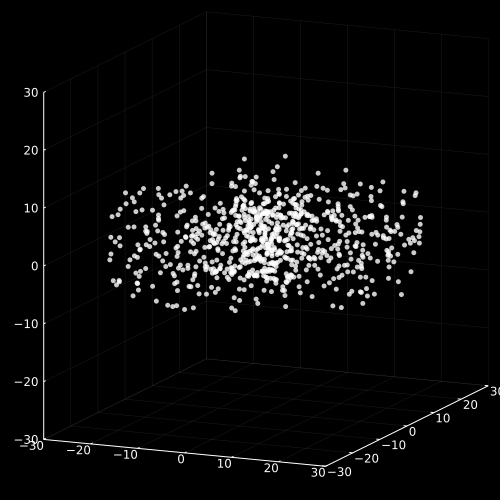

In [10]:
Random.seed!(123)

function rand_particles(num_particles::Int64, Black_Hole_Mass, R) #2D galaxy
    particles = Body[]
    u1 = Uniform(0,1)
    u50 = Uniform(1,50)
    u11 = Uniform(-1,1)
    push!(particles, Body(1,[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], Black_Hole_Mass)) #super massive black hole
    for i = 2:num_particles
        θ = 2π*rand(u1)  #Uniform random numbers between [0,1]
        r = R*rand(u1)  #Uniform random numbers between [0,R]
        z = R*rand(u11)/4
        rr = SVector(r*cos(θ), r*sin(θ), z)
        v =  cross(SVector(0,0,sqrt(G*Black_Hole_Mass/(norm(rr)^3))), rr) #v=Ω×r
        mass = rand(u50) #Uniform random numbers between [1,50]
        push!(particles, Body(i, rr, v, mass))
            
    end
    particles
end

bodies = rand_particles(800, 4e6, 30)
display(show_particles(bodies,Lim=30))

### 3. Agregue al código una función que permita obtener una gráfica de velocidad orbital de todas las partículas vs. distancia radial al centro de la distribución.


In [35]:
function graph_vel(particles; Lim=40)
    data_r = zeros(length(particles))
    data_v = zeros(length(particles))
    for i in 1:length(particles)
        data_r[i]= norm(particles[i].position)
        data_v[i]= norm(particles[i].velocity)
    end
    plot = scatter(data_r,data_v)
    xlabel!("r")
    ylabel!("v")
    xlims!((0,Lim))
    return plot
end

graph_vel (generic function with 1 method)

### 4. Modelo 1. Agregue al código una opción que permita un modelo que incluya un agujero negro supermasivo con masa M en el centro de la galaxia y una distribución aleatoria de partículas con velocidades angulares iniciales Keplerianas,
\begin{equation}
    \Omega_k(r)=\sqrt{\frac{GM}{r^3}}
\end{equation}

### 5. Modelo 2. Agregue al código una opción que permita un modelo en el que las partículas se distribuyan con un perfil de densidad superficial exponencial
\begin{equation}
    \Sigma(r)=\Sigma_0e^{-r/R_d}
\end{equation}

donde la longitud de escala puede estimarse del orden de $R_d = 0,1R$ con R el radio de la galaxia y donde las velocidades tangenciales inciales estén dadas por
\begin{equation}
    v_0^2=4\pi G\Sigma_0R_dy^2(I_0(y)K_0(y)-I_1(y)K_1(y))
\end{equation}

con $y = \frac{r}{2R_d}$ y donde $I_n$ y $K_n$ son las funciones modificadas de Bessel (estas pueden ser implementadas utilizando librerías).

Después de realizar estas modificaciones, utilice los modeles 1 y 2 implementados para ilustrar el comportamiento de la Vía Láctea utilizando alrededor de 5000 estrellas con masas entre 1M⊙ y 50M⊙ , en un intervalo de tiempo de 13 Gyr y utilizando los siguientes parámetros

Radio de la Galaxia: 30 kpc

Masa del agujero negro central: 4 × 10^6 M⊙

En el caso del Modelo 2 puede escalar la distribución de masa como considere adecuado, siempre y cuando tenga razones físicas para sustentar las suposiciones que realice. Obtenga también la curva de velocidad de las estrellas en el instante final de la evolución para cada uno de los modelos.

----

Para poder distribuir las masas cumpliendo con el perfil exponencial, sabemos que si x distribuye uniforme entre a y b, entonces el valor esperado es $\mu=\frac{a+b}{2}$. Entonces, la masa total de la galaxia va a ser en promedio 
$M_T=N\frac{a+b}{2}$ donde N es el número de estrellas y a y b el rango de posibles valores de las masas de las estrellas. Además, la integral sobre la distribución de densidad en la galaxia debe ser igual a la masa total, entonces
\begin{split}
    \begin{equation}
        M_T=\int_0^{2\pi}\int_0^R\Sigma_0e^{-r/R_d}drd\theta\\
        M_T=2\pi\Sigma_0(R_d-R_de^{-R/R_d})\\
        \Sigma_0=\frac{M_T}{2\pi(R_d-R_de^{-R/R_d})}
    \end{equation}
\end{split}

Para poder distribuir las partículas, estas se van colocando por anillos para que la densidad tenga la masa adecuada, de modo que la masa en un anillo de la galaxia que va de $r_1$ hasta $r_2$ es
\begin{split}
    \begin{equation}
        M=\int_0^{2\pi}\int_{r_1}^{r_2}\Sigma_0e^{-r/R_d}drd\theta\\
        M=2\pi\Sigma_0R_d(e^{-r_1/R_d}-e^{-r_2/R_d})\\
    \end{equation}
\end{split}
Entonces, por cada región de la galaxia, se bebe asegurar que haya la cantidad correcta de masa.

In [12]:
t = 13     #Gyr
N = 2000   #particles
R = 30     #Galaxy radii kpc
M = 4e6    #Black hole mass

4.0e6

In [13]:
function rand_kepler_particles(num_particles::Int64, Black_Hole_Mass, R) #2D galaxy
    particles = Body[]
    u1 = Uniform(0,1)
    u50 = Uniform(1,50)
    push!(particles, Body(1,SVector(0.0, 0.0, 0.0), SVector(0.0, 0.0, 0.0), Black_Hole_Mass)) #super massive black hole
    for i = 2:num_particles
        θ = 2π*rand(u1)  #Uniform random numbers between [0,1]
        r = R*rand(u1)  #Uniform random numbers between [0,R]
        z = 0
        rr = SVector(r*cos(θ), r*sin(θ), z)
        v = cross(SVector(0,0,sqrt(G*Black_Hole_Mass/(norm(rr)^3))), rr) #v=Ω×r
        mass = rand(u50) #Uniform random numbers between [1,50]
        push!(particles, Body(i, rr, v, mass))
            
    end
    particles
end
function rand_exp_particles(num_particles::Int64,R; partitions=10) #2D galaxy
    particles = Body[]
    Rd = 0.1*R
    u1 = Uniform(0,1)
    u50 = Uniform(1,50)
    Mt = num_particles*(50-1)/2
    Σ0=Mt/(2*pi*(Rd-exp(-R/Rd)))
    dr = R/partitions
    r = 0
    for i in 1:partitions
        u = Uniform(r,r+dr)
        M = 2*pi*Σ0*Rd*(exp(-r/Rd)-exp(-(r+dr)/Rd))
        while(M>0)
            θ = 2π*rand(u1)
            m = rand(u50)
            rr= rand(u)
            y = rr/(2*Rd)
            v0 = sqrt(4*pi*G*Σ0*Rd*y^2*(besseli(0,y)*besselk(0,y)-besseli(1,y)*besselk(1,y)))
            push!(particles, Body(i,SVector(r*cos(θ), r*sin(θ), 0.0), SVector(v0*sin(θ), -v0*cos(θ), 0.0), m))
            M-=m
        end
        r+=dr
    end
    println("Total Number of particles: ", length(particles))
    particles
end

rand_exp_particles (generic function with 1 method)

Definamos los parámetros para la simulación

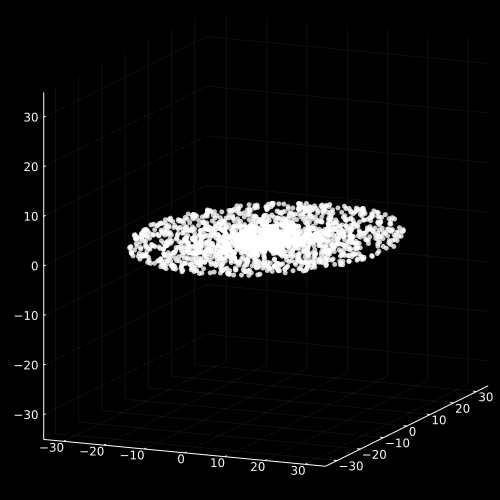

In [14]:
Lim1 = 35
particles1 = rand_kepler_particles(N,M,R)
show_particles(particles1,Lim=Lim1)

Ahora, hagamos las simulaciones

In [15]:
dt = 0.005 #Gaños
n = round(Int64, t/dt)
@time frames1 = simulate(particles1, n, Δt=dt, Nframes=300, show_progress=true)
println("Model 1 done.")

Progress: 100%|███████████████████████████| Time: 0:34:57 ( 0.81  s/it)


2099.013425 seconds (69.56 G allocations: 1.586 TiB, 8.46% gc time)
Model 1 done.


┌ Info: Saved animation to 
│   fn = /home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation1.gif
└ @ Plots /home/wind/.julia/packages/Plots/AJMX6/src/animation.jl:114


Plots.AnimatedGif("/home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation1.gif")
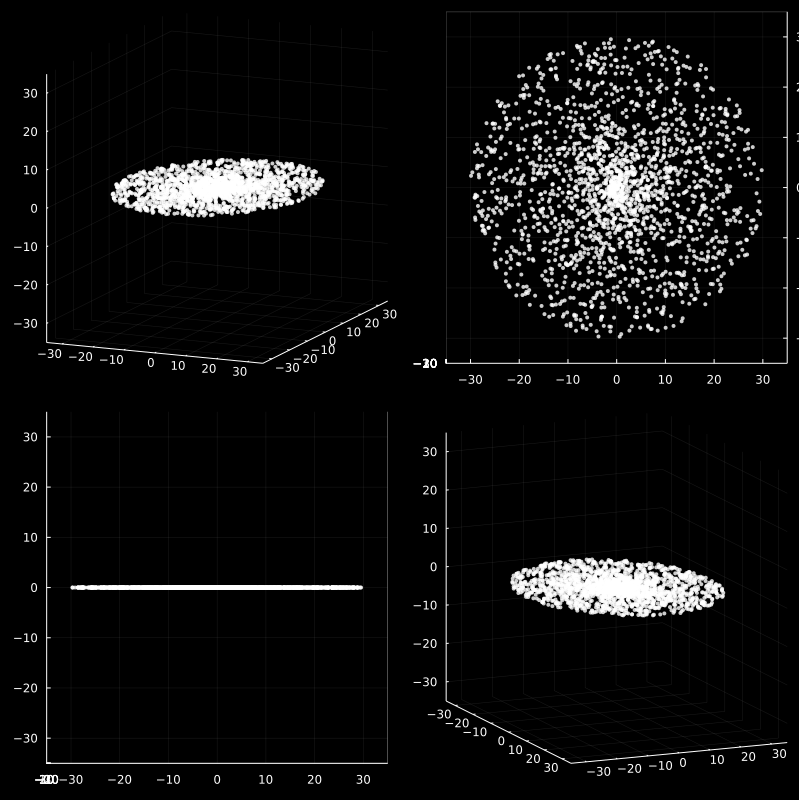

In [16]:
animate_frames(frames1, frame_rate=5, quadview = true, file_name = "animation1", Lim=Lim1)

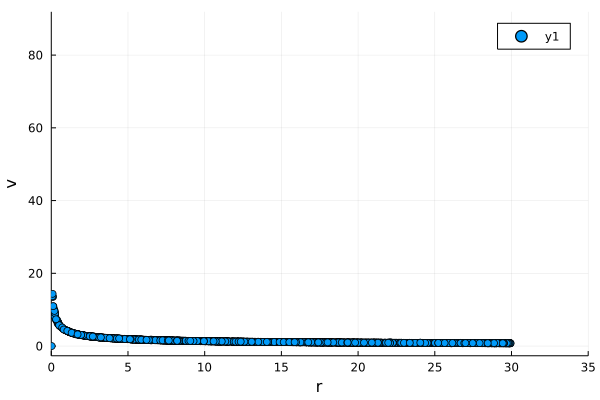

In [37]:
graph_vel(frames1[length(frames1)],Lim=35)

Total Number of particles: 2760


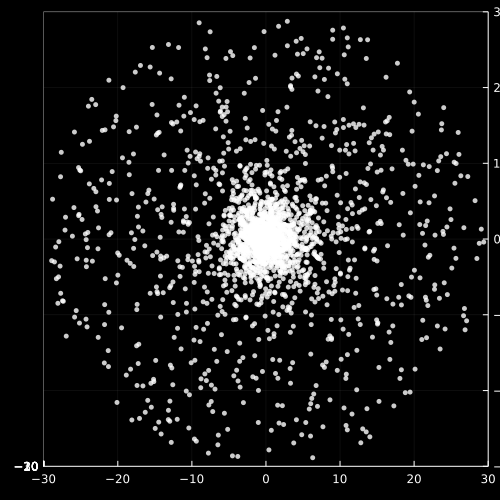

In [18]:
Lim2 = 35
particles2 = rand_exp_particles(N,R,partitions=N/2)
show_particles(particles2,0.0,90.0,Lim=Lim2)

In [30]:
t = 90 #Gyr
dt = 0.01 #Gyr
n = round(Int64, t/dt)
@time frames2 = simulate(particles2, n, Δt=dt, Nframes=300, show_progress=true)
println("Model 2 done.")

Progress: 100%|███████████████████████████| Time: 3:56:00 ( 1.57  s/it)


14160.061876 seconds (443.41 G allocations: 10.094 TiB, 8.37% gc time)
Model 2 done.


┌ Info: Saved animation to 
│   fn = /home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation2.gif
└ @ Plots /home/wind/.julia/packages/Plots/AJMX6/src/animation.jl:114


Plots.AnimatedGif("/home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation2.gif")
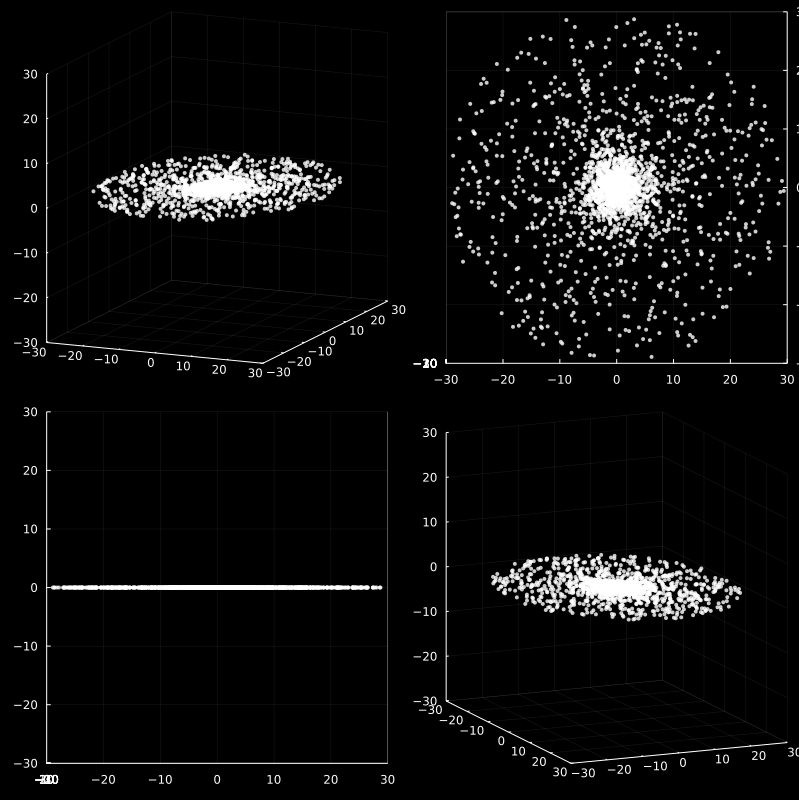

In [31]:
animate_frames(frames2, frame_rate=5, quadview = true, file_name = "animation2", Lim=Lim2)

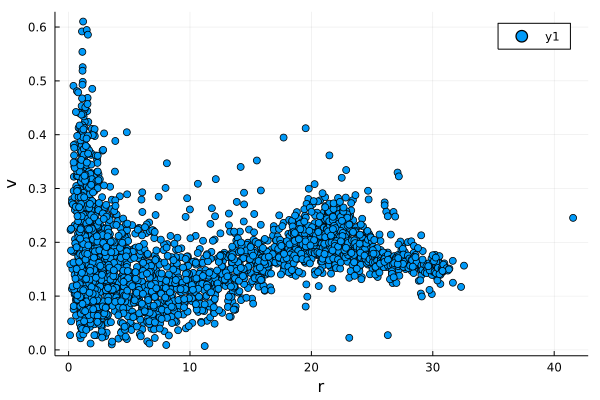

In [32]:
graph_vel(frames2[length(frames2)],Lim=45)

# Comparación con el algoritmo tradicional

Para ver si enserio se gana tiempo con este algoritmo hagamos la comparación con el algoritmo tradicional. Para ello, vamos a usar la implementación del ejercicio 3. 

In [22]:
mutable struct Molecule
    #Position
    position::SVector{3, Float64}
    #Velocity
    velocity::SVector{3, Float64}
    #Mass
    mass::Float64
    #force
    force::SVector{3, Float64}
end
function clear_f(body::Molecule)
    body.force=SVector(0.0, 0.0, 0.0)
end
function move_r(body::Molecule,dt::Float64,cte::Float64=1)
    body.position+=body.velocity*dt*cte
end
function move_v(body::Molecule,dt::Float64,cte::Float64=1)
    body.velocity+=body.force*dt*cte/body.mass
end
function calc_f(body::Array{Molecule,1}; ϵ::Float64=0.02)
    for i in 1:length(body)
        for j in i+1:length(body)
            dr = body[j].position-body[i].position
            d = norm(dr)
            F = -G*body[i].mass*body[j].mass*dr/((d+ϵ)^3)
            body[i].force+=-F #3 Newton Law
            body[j].force+=F 
        end
    end
end
function step_PEFRL(body::Array{Molecule,1},Δt::Float64)
    const1 = 0.1786178958448091      #ζ
    const3 = -0.6626458266981849e-1  #χ
    const4 = -0.2123418310626054     #λ
    const2 = (1-2*const4)/2          #(1-2λ)/2
    const5 = 1-2*(const3+const1)     #1-2*(ζ+χ)
    
    for particle in body
        move_r(particle,Δt,const1)
        clear_f(particle)
    end
    calc_f(body)
    for particle in body
        move_v(particle,Δt,const2)
        move_r(particle,Δt,const3)
        clear_f(particle)
    end
    calc_f(body)
    for particle in body
        move_v(particle,Δt,const4)
        move_r(particle,Δt,const5)
        clear_f(particle)
    end
    calc_f(body)
    for particle in body
        move_v(particle,Δt,const4)
        move_r(particle,Δt,const3)
        clear_f(particle)
    end
    calc_f(body)
    for particle in body
        move_v(particle,Δt,const2)
        move_r(particle,Δt,const1)
    end
end
function Propagate(particles::Array{Molecule,1}, steps::Int64; Δt::Float64 = 0.1, Nframes=200, show_progress=false)
    frames = Array{Molecule,1}[] 
    draw=round(Int32,steps/Nframes)
    push!(frames, deepcopy(particles)) #save initial condition
    p = Progress(steps, enabled=show_progress, showspeed=true)
    for i in 1:steps
        #Perform time step integration
        step_PEFRL(particles,dt)
        
        #Save simulation data every draw steps 
        if i%draw==0
            push!(frames, deepcopy(particles))
        end
        next!(p)
    end
    return frames
end
function rand_kepler_particles2(num_particles::Int64, Black_Hole_Mass, R) #2D galaxy
    u1 = Uniform(0,1)
    u50 = Uniform(1,50)
    particles = Molecule[]
    push!(particles, Molecule([0.0, 0.0, 0.0], [0.0, 0.0, 0.0], Black_Hole_Mass, [0.0,0.0,0.0])) #super massive black hole
    for i = 2:num_particles
        θ = 2π*rand(u1)  #Uniform random numbers between [0,1]
        r = R*rand(u1)  #Uniform random numbers between [0,R]
        z = 0
        rr = [r*cos(θ), r*sin(θ), z]
        v = cross([0,0,sqrt(G*Black_Hole_Mass/(norm(rr)^3))], rr) #v=Ω×r
        mass = rand(u50) #Uniform random numbers between [1,50]
        push!(particles, Molecule(rr, v, mass, [0.0,0.0,0.0]))
            
    end
    particles
end

rand_kepler_particles2 (generic function with 1 method)

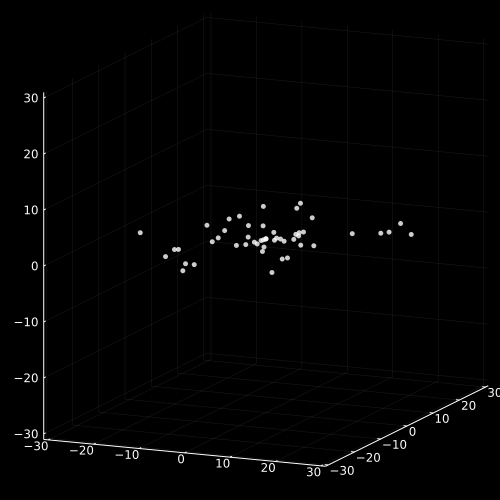

In [23]:
particles3 = rand_kepler_particles2(50,4e6,30)
show_particles(particles3,Lim=31)

In [24]:
@time frames3 = Propagate(particles3, 2500, Δt=0.005, Nframes=300, show_progress=true)
println("Brutte force done")

Progress: 100%|███████████████████████████| Time: 0:00:04 ( 1.95 ms/it)


  4.878268 seconds (220.60 M allocations: 5.481 GiB, 11.70% gc time)
Brutte force done


┌ Info: Saved animation to 
│   fn = /home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation3.gif
└ @ Plots /home/wind/.julia/packages/Plots/AJMX6/src/animation.jl:114


Plots.AnimatedGif("/home/wind/Documents/ejercicios04-agudelo-del_valle-04/animation3.gif")
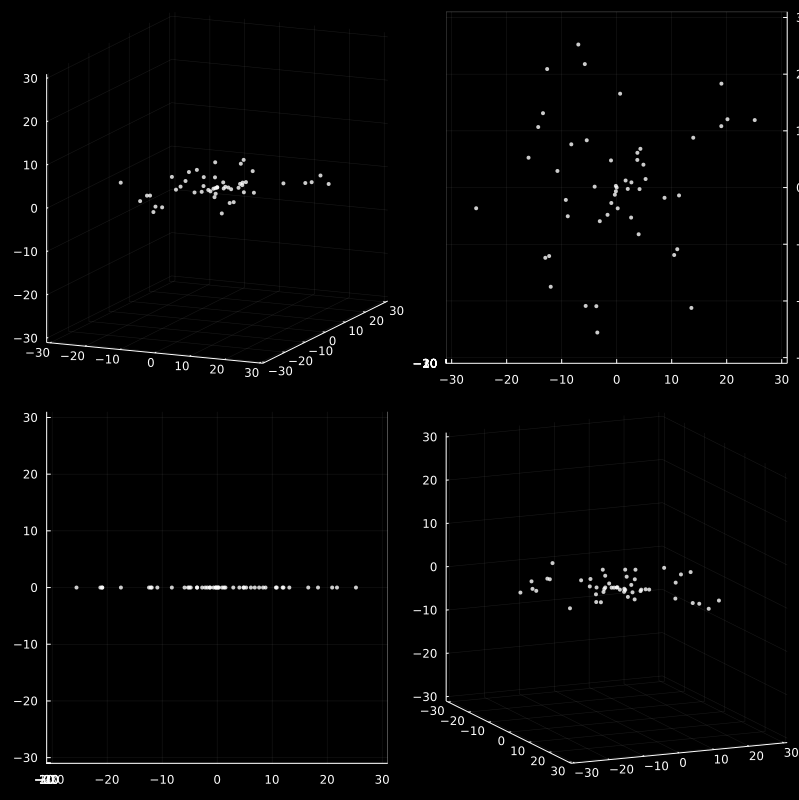

In [25]:
animate_frames(frames3, frame_rate=5, quadview = true, file_name = "animation3", Lim=31)

Hagamos una comparación con los tiempos de ejecución.

In [26]:
N = [3, 9, 20, 60, 100, 150, 200, 400, 700, 1000, 2000, 5000]
timeB1 = []
timeB2 = []
timeB3 = []
timeN = []
for i in N
    particlesB = rand_kepler_particles(i,4e6,30)
    particlesN = rand_kepler_particles2(i,4e6,30)
    tB1 = @elapsed frames = simulate(deepcopy(particlesB), 10, Δt=0.01, θ=0.1, Nframes=2)
    tB2 = @elapsed frames = simulate(deepcopy(particlesB), 10, Δt=0.01, θ=0.4, Nframes=2)
    tB3 = @elapsed frames = simulate(deepcopy(particlesB), 10, Δt=0.01, θ=0.6, Nframes=2)
    tN = @elapsed  frames = Propagate(deepcopy(particlesN), 10, Δt=0.01, Nframes=2)
    push!(timeB1, tB1)
    push!(timeB2, tB2)
    push!(timeB3, tB3)
    push!(timeN, tN)
end

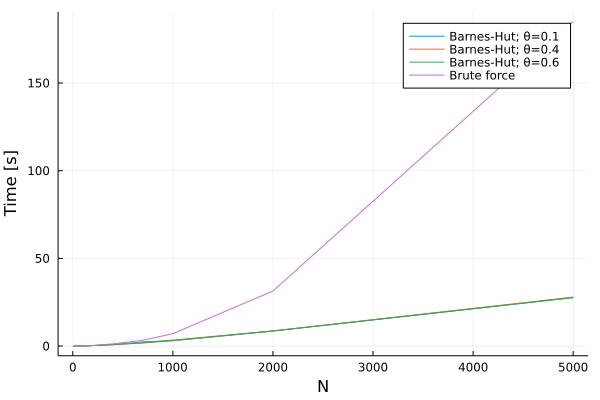

In [27]:
plot(N,timeB1,label="Barnes-Hut; θ=0.1")
plot!(N,timeB2,label="Barnes-Hut; θ=0.4")
plot!(N,timeB3,label="Barnes-Hut; θ=0.6")
plot!(N,timeN,label="Brute force")
xlabel!("N")
ylabel!("Time [s]")

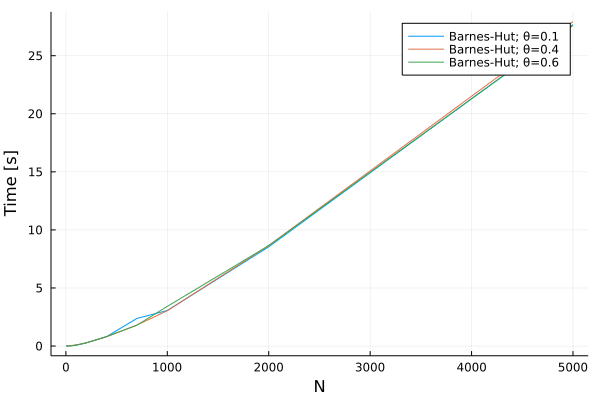

In [28]:
plot(N,timeB1,label="Barnes-Hut; θ=0.1")
plot!(N,timeB2,label="Barnes-Hut; θ=0.4")
plot!(N,timeB3,label="Barnes-Hut; θ=0.6")
xlabel!("N")
ylabel!("Time [s]")

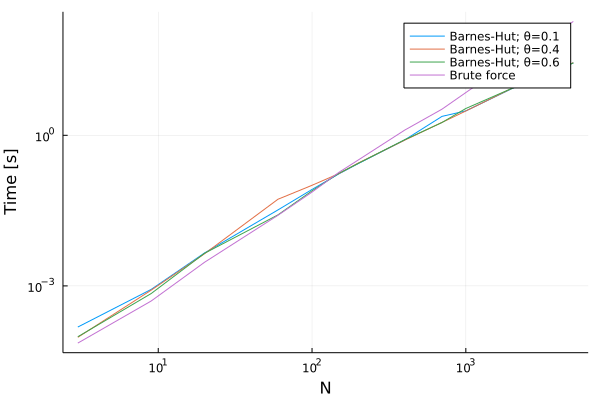

In [29]:
plot(N,timeB1,label="Barnes-Hut; θ=0.1",yaxis=:log,xaxis=:log)
plot!(N,timeB2,label="Barnes-Hut; θ=0.4",yaxis=:log,xaxis=:log)
plot!(N,timeB3,label="Barnes-Hut; θ=0.6",yaxis=:log,xaxis=:log)
plot!(N,timeN,label="Brute force",yaxis=:log,xaxis=:log)
xlabel!("N")
ylabel!("Time [s]")